In [1]:
import numpy as np
import tensorflow as tf
import tensorflow_probability as tfp
import kerastuner as kt
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import robust_laplacian
from scipy.sparse.linalg import eigsh
import gpytoolbox as gpy
from scipy.spatial import ConvexHull
from scipy.interpolate import RBFInterpolator
import open3d as o3d
from sklearn.neighbors import NearestNeighbors
import plotly.graph_objects as go

2025-08-19 13:06:11.465507: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1755617771.483501 1950211 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1755617771.489648 1950211 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1755617771.504097 1950211 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1755617771.504115 1950211 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1755617771.504117 1950211 computation_placer.cc:177] computation placer alr

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
tf.random.set_seed(314159)
np.random.seed(314159)

In [3]:
umin = 0.0
umax = np.pi
vmin = 0.0
vmax = 2*np.pi

In [4]:
# Compute the area density function of the surface - p is a point (u,v)
def areaDensity(p, surface):
  with tf.GradientTape(persistent=True) as tape:
    tape.watch(p)
    u = p[:,0]
    v = p[:,1]
    s = surface(u, v)

  J = tape.batch_jacobian(s, p)

  s_u = J[:,:,0]
  s_v = J[:,:,1]

  cross_product = tf.linalg.cross(s_u, s_v)

  area = tf.norm(cross_product, keepdims=True, axis=1)

  return area

In [5]:
def findBound(surface, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, size_grid=100):
  u = tf.linspace(umin, umax, size_grid)
  v = tf.linspace(vmin, vmax, size_grid)

  u, v = tf.meshgrid(u, v)
  pts = tf.stack([tf.reshape(u, [-1]), tf.reshape(v, [-1])], axis=1)

  areas = areaDensity(pts, surface)

  return tf.reduce_max(areas)

In [6]:
rmin = 1.00
rmax = 1.00

In [7]:
tmin = 0.0
tmax = T_max = 0.5
tstep = 100

In [8]:
N_data = 16
N_sensor = 512
N_inputs = 10000
modes = 128
width = 50
depth = 4

In [9]:
def sphere(u, v, a=1.0, b=1.0, c=1.0):
  return tf.stack([a * tf.sin(u) * tf.cos(v), b * tf.sin(u) * tf.sin(v), c * tf.cos(u)], axis=1)

In [10]:
# bf = lambda u, v: 1 + 0.2 * tf.sin(5.0 * u) * tf.sin(5.0 * v)

In [11]:
# def sphere(u, v):
#     return tf.stack([bf(u,v) * tf.sin(u) * tf.cos(v), bf(u,v) * tf.sin(u) * tf.sin(v), bf(u,v) * tf.cos(u)], axis=1)

In [12]:
# def sphere(u, v, R=1.0, r=0.5):
#     return tf.stack([(R + r * tf.cos(v)) * tf.cos(u), (R + r * tf.cos(v)) * tf.sin(u), r * tf.sin(v)], axis=1)

In [13]:
radii = 1.0

In [14]:
def normalVector(xyz, knn=30):
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(xyz)
    # Use a k-NN search to estimate normals
    pcd.estimate_normals(
        search_param=o3d.geometry.KDTreeSearchParamKNN(knn=knn)
    )
    # (Optional) consistently orient normals
    pcd.orient_normals_towards_camera_location(pcd.get_center())
    normals = np.asarray(pcd.normals, dtype=np.float32)
    return normals / np.linalg.norm(normals, axis=1, keepdims=True)

In [15]:
# Generate the projection matrix at a point p
def projMatrix(x, y, z, normals):
    p = tf.stack([x, y, z], axis=1)
    n = normals
    n = tf.expand_dims(n, axis=2)
    n_outer = tf.matmul(n, tf.transpose(n, [0, 2, 1]))
    I = tf.eye(3, batch_shape=[tf.shape(p)[0]])
    return I - n_outer

In [16]:
def generateRadii(n, rmin=rmin, rmax=rmax):
    # radii = tf.random.uniform((n, 1), minval=rmin, maxval=rmax)
    radii = tf.random.normal((n, 1))

    return radii

In [17]:
# center1 = tf.squeeze(sphere(tf.constant([0.0], dtype=tf.float32), tf.constant([0.0], dtype=tf.float32))); center1
# center2 = tf.squeeze(sphere(tf.constant([np.pi], dtype=tf.float32), tf.constant([0.0], dtype=tf.float32))); center2
# center3 = tf.squeeze(sphere(tf.constant([np.pi / 2], dtype=tf.float32), tf.constant([np.pi], dtype=tf.float32))); print(center3)
# center4 = tf.squeeze(sphere(tf.constant([np.pi / 4], dtype=tf.float32), tf.constant([3 * np.pi / 4], dtype=tf.float32))); print(center4)
# centers = [center1, center2, center3, center4]

In [18]:
a = -0.048113
b = 1.202813

In [19]:
def kernel(x1, x2, l=0.25, sigma=1.0):
    return sigma ** 2 * tf.exp(-tf.norm(tf.expand_dims(x1, axis=1) - tf.expand_dims(x2, axis=0), axis=-1) ** 2 / (2 * l ** 2))

In [20]:
def getKernelMatrix(xyz):
    return kernel(xyz, xyz)

In [21]:
h_global = tf.random.normal([N_inputs, 2], seed=123456)


I0000 00:00:1755617775.251211 1950211 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5249 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060 Ti, pci bus id: 0000:02:00.0, compute capability: 8.6


In [22]:
def initial(x, y, z):
    K = getKernelMatrix(tf.squeeze(tf.stack([x, y, z], axis=1)))
    K += 1e-2 * tf.eye(K.shape[0])
    L = tf.linalg.cholesky(K)

    h = h_global[:x.shape[0]]

    u = tf.squeeze(tf.matmul(L, h))

    return [u[:,0:1], u[:,1:2]]

In [23]:
# def initial(x, y, z):
#     u0, v0 = 0.0, 0.0
#     i = tf.linspace(1.0, 5.0, 5)
#     i = tf.reshape(i, [1, -1])
#     print(i.shape, x.shape, y.shape, z.shape)
#     u0 = a + b + tf.reduce_sum((1 / (20.0 * i)) * tf.sin(2 * np.pi * i * x) * tf.sin(2 * np.pi * i * y) * tf.sin(2 * np.pi * i * z), keepdims=True, axis=1) * radii
#     v0 = a / (a + b)**2 + tf.reduce_sum((1 / (20.0 * i)) * tf.cos(2 * np.pi * i * x) * tf.cos(2 * np.pi * i * y) * tf.cos(2 * np.pi * i * z), keepdims=True, axis=1) * radii
#     return [u0, v0]

In [24]:
# def initial(x, y, z):
#     u0, v0 = 0.0, 0.0
#     i = tf.linspace(1.0, 5.0, 5)
#     i = tf.reshape(i, [1, -1])
#     u0 = a + b + tf.reduce_sum((1 / (20.0 * i)) * tf.sin(2 * np.pi * i * x) * tf.sin(2 * np.pi * i * y) * tf.sin(2 * np.pi * i * z), keepdims=True, axis=1) * radii
#     v0 = a / (a + b)**2 + tf.reduce_sum((1 / (20.0 * i)) * tf.cos(2 * np.pi * i * x) * tf.cos(2 * np.pi * i * y) * tf.cos(2 * np.pi * i * z), keepdims=True, axis=1) * radii
#     return [u0, v0]

In [25]:
# def initial(x, y, z, radii, k=0.3):
#   u = 0.0*x
#   # u = tf.sin(x + y) * tf.cos(z) * coefficients
#   u += radii * x
#   return [u, u]

In [26]:
def killRate(x, y, z, bias=0.06):
    phi = tf.atan2(y, x)
    return bias + 1e-3 * tf.cos(phi)

In [27]:
def generateDomainPoints(n, surface, max=max, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, saftey_factor=5):
  batch_size = n * saftey_factor

  max = findBound(surface, size_grid=100, umin=0.0, umax=umax, vmin=vmin, vmax=vmax)

  U = tf.random.uniform((batch_size,), minval=umin, maxval=umax)
  V = tf.random.uniform((batch_size,), minval=vmin, maxval=vmax)
  W = tf.random.uniform((batch_size,), minval=0.0, maxval=1.0)

  P = tf.stack([U, V], axis=1)
  A = areaDensity(P, surface) / (max * 1.05)

  mask = W <= tf.squeeze(A)

  accept_U = tf.boolean_mask(U, mask)
  accept_V = tf.boolean_mask(V, mask)

  if tf.shape(accept_U)[0] < n or tf.shape(accept_V)[0] < n:
    print('Not enough points generated - increase saftey_factor')
    return
  accept_U = accept_U[0:n]
  accept_V = accept_V[0:n]
  domain_pts = tf.stack([accept_U, accept_V], axis=1)
  if tf.shape(domain_pts)[0] > n:
    domain_pts = domain_pts[:,0:n]

  return domain_pts

In [28]:
# unique for this problem
def generateCollocationPoints(n, surface, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, tmin=0.0, tmax=1.0):
  domain_pts = generateDomainPoints(n, surface)
  xyz = surface(domain_pts[:,0], domain_pts[:,1])
  t = tf.random.uniform((n,), minval=tmin, maxval=tmax)

  return tf.stack([xyz[:,0], xyz[:,1], xyz[:,2], t], axis=1)

In [29]:
def generateInitialPoints(n, surface, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, tmin=0.0):
  xyz = generateCollocationPoints(n, surface, umin=umin, umax=umax, vmin=vmin, vmax=vmax)[:,0:3]
  x = xyz[:,0:1]
  y = xyz[:,1:2]
  z = xyz[:,2:3]
  t = tf.ones_like(x) * tmin
  return [tf.concat([x, y, z, t], axis=1), initial(x, y, z)]

In [30]:
def generatePoints(n, surface, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, tmin=0.0, tmax=1.0):
  pde_pts = generateCollocationPoints(n, surface, umin=umin, umax=umax, vmin=vmin, vmax=vmax, tmin=tmin, tmax=tmax)
  ic_pts = generateInitialPoints(n, surface, umin=umin, umax=umax, vmin=vmin, vmax=vmax, tmin=tmin)

  return pde_pts, ic_pts

In [31]:
pde_pts, ic_pts = generatePoints(N_inputs, sphere, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, tmin=tmin, tmax=tmax)

I0000 00:00:1755617777.232346 1950211 cuda_solvers.cc:175] Creating GpuSolver handles for stream 0x40776f90


In [32]:
x, y, z, t = pde_pts[:,0:1], pde_pts[:,1:2], pde_pts[:,2:3], pde_pts[:,3:4]

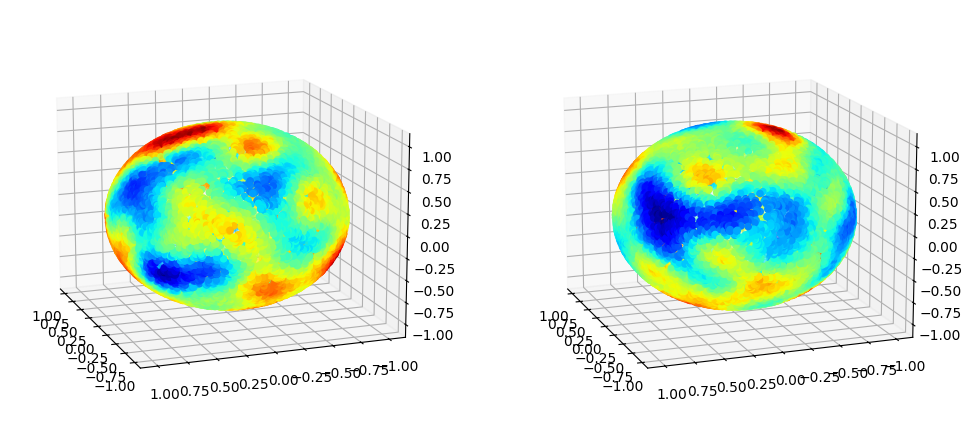

In [33]:
fig = plt.figure(figsize=(12, 6))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122, projection='3d')
initial_cond = initial(x, y, z)
u0 = initial_cond[0]
v0 = initial_cond[1]
u0_norm = plt.Normalize(vmin=u0.numpy().min(), vmax=u0.numpy().max())
v0_norm = plt.Normalize(vmin=v0.numpy().min(), vmax=v0.numpy().max())

scatter_u = ax1.scatter(x, y, z, c=u0, cmap='jet', norm=u0_norm, marker='o')
scatter_v = ax2.scatter(x, y, z, c=v0, cmap='jet', norm=v0_norm, marker='o')

for ax in [ax1, ax2]:
    ax.view_init(elev=15, azim=160)
plt.show()

In [34]:
# plot_vector_field_3d_lines_tf(pde_pts[:,0:3], vel_field, normalVector)

In [35]:
print(pde_pts.shape)
print(ic_pts[1][0].shape)

(10000, 4)
(10000, 1)


In [36]:
def normalVector(xyz, knn=30):
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(xyz)
    # Use a k-NN search to estimate normals
    pcd.estimate_normals(
        search_param=o3d.geometry.KDTreeSearchParamKNN(knn=knn)
    )
    # (Optional) consistently orient normals
    pcd.orient_normals_towards_camera_location(pcd.get_center())
    normals = np.asarray(pcd.normals, dtype=np.float32)
    return normals / np.linalg.norm(normals, axis=1, keepdims=True)

In [37]:
def compute_normal_jacobian(xyz, normals, k=200, h=0.5):
    """
    xyz: (N,3)
    normals: (N,3)
    k: number of neighbors
    h: length‐scale for Gaussian weighting
    returns: (N,3,3)
    """
    N = xyz.shape[0]
    jac = np.zeros((N, 3, 3), dtype=np.float32)

    nbrs = NearestNeighbors(n_neighbors=k+1).fit(xyz)
    distances, indices = nbrs.kneighbors(xyz)

    for i in range(N):
        neigh = indices[i, 1:]
        A = xyz[neigh] - xyz[i]         # (k,3)
        B = normals[neigh] - normals[i] # (k,3)

        # Gaussian weights, shape (k,)
        w = np.exp(- (distances[i,1:]**2) / (h*h))
        # build weighted A and B
        Wsqrt = np.sqrt(w)[:, None]     # (k,1)
        Aw = A * Wsqrt                  # each row scaled
        Bw = B * Wsqrt

        # solve Aw @ J = Bw
        J, *_ = np.linalg.lstsq(Aw, Bw, rcond=None)
        jac[i] = J

    return jac

In [38]:
normals = normalVector(pde_pts[:,0:3])
normal_jacobian = tf.convert_to_tensor(compute_normal_jacobian(pde_pts[:,0:3].numpy(), normals), dtype=tf.float32)

In [39]:
all_pts = tf.concat([pde_pts, ic_pts[0]], axis=0) # use this one for soft constraints
# all_pts = pde_pts # use this one for hard contraint
pmin = tf.reduce_min(all_pts, axis=0)
pmax = tf.reduce_max(all_pts, axis=0)

In [40]:
# This is a special normalize layer for this pde case only
class Normalize(tf.keras.layers.Layer):
  def __init__(self, xmin, xmax, name=None, **kwargs):
    super(Normalize, self).__init__(name=name)
    self.xmin = xmin
    self.xmax = xmax
    super(Normalize, self).__init__(**kwargs)

  def call(self, inputs):
    # if inputs.shape[0] == 2:
    #   constant_part = inputs[0:1:,:,]
    #   other_part = inputs[1:2:,:,]
    #   other_part = 2.0*(other_part-self.xmin[1:2:,:,])/(self.xmax[1:2:,:,]-self.xmin[1:2:,:,])-1.0
    #   return tf.concat([constant_part, other_part], axis=0)
    return 2.0*(inputs-self.xmin)/(self.xmax-self.xmin)-1.0

  def get_config(self):
    config = super(Normalize, self).get_config()
    config.update({'xmin': self.xmin, 'xmax': self.xmax})
    return config

In [41]:
def buildModel(width, depth, pmin, pmax):
  trunk_x = tf.keras.layers.Input(shape=(1,))
  trunk_y = tf.keras.layers.Input(shape=(1,))
  trunk_z = tf.keras.layers.Input(shape=(1,))
  trunk_t = tf.keras.layers.Input(shape=(1,))
  b = tf.keras.layers.Concatenate()([trunk_x, trunk_y, trunk_z, trunk_t])
  
  b = Normalize(pmin, pmax)(b)
  for i in range(depth):
    b = tf.keras.layers.Dense(width, activation='tanh')(b)
  out = tf.keras.layers.Dense(width, activation='tanh')(b)

  out = tf.keras.layers.Dense(2, use_bias=True)(out)

  return tf.keras.Model([trunk_x, trunk_y, trunk_z, trunk_t], out)

In [42]:
# model = buildModel(width, depth, modes)

# x, y, z, t = pde_pts[:,0], pde_pts[:,1], pde_pts[:,2], pde_pts[:,3]
# output = tf.squeeze(model([x, y, z, t]))

# output.shape

In [43]:
def L2Error(u_true, u_pred):
  return tf.norm(u_true - u_pred) / tf.norm(u_true)

In [44]:
# def hardConstraint(model, x, y, z, t, init, tmin=tmin, tmax=tmax):
#     x, y, z, t = tf.reshape(x, [-1, 1]), tf.reshape(y, [-1, 1]), tf.reshape(z, [-1, 1]), tf.reshape(t, [-1, 1])
#     nn = model([x, y, z, t])

#     uv0 = init

#     u = uv0 + (t - tmin) / (tmax - tmin) * nn
#     # u = initial(x, y, z, radii) + nn

#     return u

In [45]:
# def hardConstraint(model, x, y, z, t, init, tmin=tmin, tmax=tmax):
#     x, y, z, t = tf.reshape(x, [-1, 1]), tf.reshape(y, [-1, 1]), tf.reshape(z, [-1, 1]), tf.reshape(t, [-1, 1])
#     nn = model([x, y, z, t])

#     # uv0 = tf.concat(initial(x,y,z), axis=-1)
#     uv0 = init

#     u = uv0 + (t - tmin) / (tmax - tmin) * nn
#     # u = initial(x, y, z, radii) + nn

#     return u

In [46]:
# def hardConstraint(model, x, y, z, t, step, models, prev_inits, intervals, tmin, tmax):
#     x, y, z, t = tf.reshape(x, [-1, 1]), tf.reshape(y, [-1, 1]), tf.reshape(z, [-1, 1]), tf.reshape(t, [-1, 1])
#     nn = model([x, y, z, t])
#     if step == 1:
#         uv0 =  tf.concat(initial(x, y, z), axis=-1)

#     else:
#         # Use previous model directly
#         prev_model = models[step-2]
#         t_boundary = tf.ones_like(x) * tmin  # boundary time
#         prev_nn = prev_model([x, y, z, t_boundary])
        
#         # You'll need to store previous model's time range
#         prev_uv0 = prev_inits[step-2]
#         prev_tmin, prev_tmax = intervals[step-2]
#         uv0 = prev_uv0 + (t_boundary - prev_tmin) / (prev_tmax - prev_tmin) * prev_nn
    
#     u = uv0 + (t - tmin) / (tmax - tmin) * nn
#     return u

In [47]:
def hardConstraint(model, x, y, z, t, step, models, prev_inits, intervals, tmin, tmax):
    x, y, z, t = tf.reshape(x, [-1, 1]), tf.reshape(y, [-1, 1]), tf.reshape(z, [-1, 1]), tf.reshape(t, [-1, 1])
    nn = model([x, y, z, t])
    return nn

In [48]:
# output = tf.squeeze(hardConstraint(model, x, y, z, t))

In [49]:
# @tf.function
def trainingStep(model, optimizer, pde_pts, ic_pts, step, init, models, intervals, min_time, max_time, normals, normal_jacobian, lambda_pde=1.0, lambda_ic=1.0, alpha=0.0):
  x, y, z, t = tf.split(pde_pts, 4, axis=1)
  x, y, z, t = tf.squeeze(x), tf.squeeze(y), tf.squeeze(z), tf.squeeze(t)
  xyz = tf.stack([x, y, z], axis=1)

  xi, yi, zi, ti = tf.split(ic_pts[0], 4, axis=1)
  xi, yi, zi, ti = tf.squeeze(xi), tf.squeeze(yi), tf.squeeze(zi), tf.squeeze(ti)
  ui = tf.concat(ic_pts[1], axis=-1)

  with tf.GradientTape() as tape:
    with tf.GradientTape(persistent=True) as tape2:
      tape2.watch([x, y, z, t])
      net = tf.squeeze(hardConstraint(model, x, y, z, t, step, models, init, intervals, tmin=min_time, tmax=max_time))
      u_pde = net[:,0]
      v_pde = net[:,1]  

      ux, uy, uz, ut = tape2.gradient(u_pde, [x, y, z, t], unconnected_gradients=tf.UnconnectedGradients.ZERO)

      # uncomment for laplacian
      uxx = tape2.gradient(ux, x, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      uyy = tape2.gradient(uy, y, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      uzz = tape2.gradient(uz, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)

      uxy = tape2.gradient(ux, y, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      uxz = tape2.gradient(ux, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      uyz = tape2.gradient(uy, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)

      vx, vy, vz, vt = tape2.gradient(v_pde, [x, y, z, t], unconnected_gradients=tf.UnconnectedGradients.ZERO)

      # # uncomment for laplacian
      vxx = tape2.gradient(vx, x, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      vyy = tape2.gradient(vy, y, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      vzz = tape2.gradient(vz, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)

      vxy = tape2.gradient(vx, y, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      vxz = tape2.gradient(vx, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      vyz = tape2.gradient(vy, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      
    u_grads = tf.stack([ux, uy, uz], axis=1)

    u_laplacians = uxx + uyy + uzz

    u_directional_nu = tf.reduce_sum(normals * u_grads, axis=1) # Directional derivatives of u in direction of the normal

    # uncomment for laplacian
    row0 = tf.stack([uxx, uxy, uxz], axis=1)
    row1 = tf.stack([uxy, uyy, uyz], axis=1) 
    row2 = tf.stack([uxz, uyz, uzz], axis=1) 
    u_hessian = tf.stack([row0, row1, row2], axis=1)

    u_directional_nu_second = tf.reduce_sum(normals * tf.squeeze(tf.linalg.matmul(u_hessian, tf.expand_dims(normals, axis=-1))), axis=1)

    u_surface_hess = tf.linalg.trace(tf.linalg.matmul(normal_jacobian, projMatrix(x, y, z, normals)))
    
    # surface_grads = grads - normals * tf.expand_dims(directional_nu, axis=-1)

    u_surface_laplacians = u_laplacians - u_surface_hess * u_directional_nu - u_directional_nu_second

    v_grads = tf.stack([vx, vy, vz], axis=1)

    v_laplacians = vxx + vyy + vzz

    v_directional_nu = tf.reduce_sum(normals * v_grads, axis=1) # Directional derivatives of v in direction of the normal

    # uncomment for laplacian
    row0 = tf.stack([vxx, vxy, vxz], axis=1)
    row1 = tf.stack([vxy, vyy, vyz], axis=1) 
    row2 = tf.stack([vxz, vyz, vzz], axis=1) 
    v_hessian = tf.stack([row0, row1, row2], axis=1)

    v_directional_nu_second = tf.reduce_sum(normals * tf.squeeze(tf.linalg.matmul(v_hessian, tf.expand_dims(normals, axis=-1))), axis=1)

    v_surface_hess = tf.linalg.trace(tf.linalg.matmul(normal_jacobian, projMatrix(x, y, z, normals)))

    v_surface_laplacians = v_laplacians - v_surface_hess * v_directional_nu - v_directional_nu_second

    gamma = 500.0
    vega = 50.0

    eqn1 = (ut - gamma * (a - u_pde + u_pde**2 * v_pde) - u_surface_laplacians)
    eqn2 = (vt - gamma * (b - u_pde**2 * v_pde) - vega * v_surface_laplacians) / gamma
    # eqn1 = ut - u_surface_laplacians
    # eqn2 = vt - v_surface_laplacians

    pde_loss = tf.reduce_mean(eqn1**2) + tf.reduce_mean(eqn2**2)

    u_init_pred = hardConstraint(model, xi, yi, zi, ti, step, models, init, intervals, tmin=min_time, tmax=max_time)

    ic_loss = tf.reduce_mean((u_init_pred - ui)**2)

    loss = lambda_pde * pde_loss + lambda_ic * ic_loss

  grads = tape.gradient(loss, model.trainable_variables)
  
  optimizer.apply_gradients(zip(grads, model.trainable_variables))

  return loss, pde_loss, ic_loss, grads, u_pde, v_pde

In [50]:
def final_hard_constraint(model, x, y, z, t, tmin=tmin, tmax=tmax):
    x, y, z, t = tf.reshape(x, [-1, 1]), tf.reshape(y, [-1, 1]), tf.reshape(z, [-1, 1]), tf.reshape(t, [-1, 1])
    nn = model([x, y, z, t])

    uv0 = tf.concat(initial(x,y,z), axis=-1)

    u = uv0 + (t - tmin) / (tmax - tmin) * nn
    # u = initial(x, y, z, radii) + nn

    return nn

In [51]:
@tf.function
def final_training_step(model, optimizer, pde_pts, ic_pts, data, init, min_time, max_time, normals, normal_jacobian, lambda_pde=1.0, lambda_ic=1.0, lambda_d=1.0):
  x, y, z, t = tf.split(pde_pts, 4, axis=1)
  x, y, z, t = tf.squeeze(x), tf.squeeze(y), tf.squeeze(z), tf.squeeze(t)
  xyz = tf.stack([x, y, z], axis=1)

  xi, yi, zi, ti = tf.split(ic_pts[0], 4, axis=1)
  xi, yi, zi, ti = tf.squeeze(xi), tf.squeeze(yi), tf.squeeze(zi), tf.squeeze(ti)
  ui = tf.concat(ic_pts[1], axis=-1)

  with tf.GradientTape() as tape:
    with tf.GradientTape(persistent=True) as tape2:
      tape2.watch([x, y, z, t])

      net = tf.squeeze(final_hard_constraint(model, x, y, z, t, min_time, max_time))

      u_pde = net[:,0]
      v_pde = net[:,1]  

      ux, uy, uz, ut = tape2.gradient(u_pde, [x, y, z, t], unconnected_gradients=tf.UnconnectedGradients.ZERO)

      # uncomment for laplacian
      uxx = tape2.gradient(ux, x, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      uyy = tape2.gradient(uy, y, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      uzz = tape2.gradient(uz, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)

      uxy = tape2.gradient(ux, y, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      uxz = tape2.gradient(ux, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      uyz = tape2.gradient(uy, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)

      vx, vy, vz, vt = tape2.gradient(v_pde, [x, y, z, t], unconnected_gradients=tf.UnconnectedGradients.ZERO)

      # # uncomment for laplacian
      vxx = tape2.gradient(vx, x, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      vyy = tape2.gradient(vy, y, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      vzz = tape2.gradient(vz, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)

      vxy = tape2.gradient(vx, y, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      vxz = tape2.gradient(vx, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      vyz = tape2.gradient(vy, z, unconnected_gradients=tf.UnconnectedGradients.ZERO)
      
    u_grads = tf.stack([ux, uy, uz], axis=1)

    u_laplacians = uxx + uyy + uzz

    u_directional_nu = tf.reduce_sum(normals * u_grads, axis=1) # Directional derivatives of u in direction of the normal

    # uncomment for laplacian
    row0 = tf.stack([uxx, uxy, uxz], axis=1)
    row1 = tf.stack([uxy, uyy, uyz], axis=1) 
    row2 = tf.stack([uxz, uyz, uzz], axis=1) 
    u_hessian = tf.stack([row0, row1, row2], axis=1)

    u_directional_nu_second = tf.reduce_sum(normals * tf.squeeze(tf.linalg.matmul(u_hessian, tf.expand_dims(normals, axis=-1))), axis=1)

    u_surface_hess = tf.linalg.trace(tf.linalg.matmul(normal_jacobian, projMatrix(x, y, z, normals)))
    
    # surface_grads = grads - normals * tf.expand_dims(directional_nu, axis=-1)

    u_surface_laplacians = u_laplacians - u_surface_hess * u_directional_nu - u_directional_nu_second

    v_grads = tf.stack([vx, vy, vz], axis=1)

    v_laplacians = vxx + vyy + vzz

    v_directional_nu = tf.reduce_sum(normals * v_grads, axis=1) # Directional derivatives of v in direction of the normal

    # uncomment for laplacian
    row0 = tf.stack([vxx, vxy, vxz], axis=1)
    row1 = tf.stack([vxy, vyy, vyz], axis=1) 
    row2 = tf.stack([vxz, vyz, vzz], axis=1) 
    v_hessian = tf.stack([row0, row1, row2], axis=1)

    v_directional_nu_second = tf.reduce_sum(normals * tf.squeeze(tf.linalg.matmul(v_hessian, tf.expand_dims(normals, axis=-1))), axis=1)

    v_surface_hess = tf.linalg.trace(tf.linalg.matmul(normal_jacobian, projMatrix(x, y, z, normals)))

    v_surface_laplacians = v_laplacians - v_surface_hess * v_directional_nu - v_directional_nu_second

    gamma = 500.0
    vega = 50.0

    eqn1 = (ut - gamma * (a - u_pde + u_pde**2 * v_pde) - u_surface_laplacians) / gamma # check gamma
    eqn2 = (vt - gamma * (b - u_pde**2 * v_pde) - vega * v_surface_laplacians) / gamma
    # eqn1 = ut - u_surface_laplacians
    # eqn2 = vt - v_surface_laplacians

    pde_loss = tf.reduce_mean(eqn1**2) + tf.reduce_mean(eqn2**2)

    u_init_pred = tf.squeeze(final_hard_constraint(model, xi, yi, zi, ti, min_time, max_time))

    ic_loss = tf.reduce_mean((u_init_pred - ui)**2)
    # ic_loss = 0.0

    data_loss = tf.reduce_mean((net - data)**2)

    loss = lambda_pde * pde_loss + lambda_ic * ic_loss +  lambda_d * data_loss

  grads = tape.gradient(loss, model.trainable_variables)
  
  optimizer.apply_gradients(zip(grads, model.trainable_variables))

  return loss, pde_loss, ic_loss, data_loss, grads, u_pde, v_pde

In [52]:
def train(ts, model, optimizer, pde_pts, ic_pts, step, init, models, intervals, min_time, max_time, normals, normal_jacobian, final=False, data=None, epochs=1000):
  losses = []
  pde_losses = []
  ic_losses = []
  l2s = []
  uv2 = []

  batch_size = N_inputs
  if not final:
    dataset = (
    tf.data.Dataset.from_tensor_slices((pde_pts, ic_pts[0], tf.concat(ic_pts[1], axis=-1), normals, normal_jacobian))
    .shuffle(N_inputs)
    .batch(batch_size)
    .prefetch(tf.data.AUTOTUNE)
                )
  else:
    dataset = (
    tf.data.Dataset.from_tensor_slices((pde_pts, ic_pts[0], tf.concat(ic_pts[1], axis=-1), data, normals, normal_jacobian))
    .shuffle(N_inputs)
    .batch(batch_size)
    .prefetch(tf.data.AUTOTUNE)
                )

  ran_lbfgs = False

  # for epoch in range(epochs):   
  #   avg_loss = 0.0
  #   for pde_batch, ic_batch, radii_batch, u_sensor_batch, normals_batch, normal_jac_batch in dataset:
  #     if epoch < epochs // 2:
  #       loss, pde_loss, ic_loss, grads, u_pred = trainingStep(model, optimizer, pde_batch, ic_batch, u_sensor_batch, radii_batch, normals_batch, normal_jac_batch, lambda_ic=1.0, lambda_pde=1.0, alpha=0.0) 
  #       avg_loss += loss  
  #       # losses.append(loss)
  #       # pde_losses.append(pde_loss)
  #       # ic_losses.append(ic_loss)
  #     else:
  #       loss, pde_loss, ic_loss, grads, u_pred = trainingStep(model, optimizer, pde_batch, ic_batch, u_sensor_batch, radii_batch, normals_batch, normal_jac_batch, lambda_ic=1.0, lambda_pde=1.0, alpha=0.0)   
  #       avg_loss += loss
  #       # losses.append(loss)
  #       # pde_losses.append(pde_loss)
  #       # ic_losses.append(ic_loss)
  #   losses.append(avg_loss / batch_size)

  for epoch in range(epochs):
    avg_loss = 0.0
    # for pde_batch, ic_batch, radii_batch, u_sensor_batch, v_sensor_batch, normals_batch, normal_jac_batch in dataset:
    #   loss, pde_loss, ic_loss, grads, u_pred, v_pred = trainingStep(model, optimizer, pde_batch, ic_batch, u_sensor_batch, v_sensor_batch, radii_batch, normals_batch, normal_jac_batch, lambda_ic=1.0, lambda_pde=1.0, alpha=0.0)   
      # avg_loss += loss
    if not final:
      for pde_batch, ic1_batch, ic2_batch, normals_batch, normal_jac_batch in dataset:
        ic_batch = [ic1_batch, [ic2_batch[:,0:1], ic2_batch[:,1:2]]]
        loss, pde_loss, ic_loss, grads, u_pred, v_pred = ts(model, optimizer, pde_batch, ic_batch, step, init, models, intervals, min_time, max_time, normals_batch, normal_jac_batch, lambda_ic=1.0, lambda_pde=1.0, alpha=0.0)    
        avg_loss += loss
    else:
      for pde_batch, ic1_batch, ic2_batch, data_batch, normals_batch, normal_jac_batch in dataset:
        ic_batch = [ic1_batch, [ic2_batch[:,0:1], ic2_batch[:,1:2]]]
        loss, pde_loss, ic_loss, data_loss, grads, u_pred, v_pred = ts(model, optimizer, pde_batch, ic_batch, data_batch, init, min_time, max_time, normals_batch, normal_jac_batch, lambda_ic=1.0, lambda_pde=1.0, lambda_d=1.0)
        avg_loss += loss    
    # losses.append(avg_loss / batch_size)
    losses.append(avg_loss / batch_size)

    if epoch % 100 == 0:
      print(f"Epoch {epoch} - PDE Loss {pde_loss: .6f} - IC Loss {ic_loss: .6f} - Total Loss {loss: .6f}")
      print("mean u:", tf.reduce_mean(u_pred).numpy())
      # print("std u:", tf.math.reduce_std(u_pred).numpy())
      print("mean v:", tf.reduce_mean(v_pred).numpy())
      # print("std v:", tf.math.reduce_std(v_pred).numpy())
      print("uv^2:", tf.reduce_mean(u_pred * v_pred ** 2).numpy())
      # for g in grads:
      #     tf.print("grad mean:", tf.reduce_mean(tf.abs(g)))
      #     tf.print("grad max:", tf.reduce_max(tf.abs(g)))
      uv2.append(tf.reduce_mean(u_pred * v_pred ** 2).numpy())
  
  return losses, pde_losses, ic_losses, l2s, grads, uv2

In [53]:
# model = buildModel(width, depth, modes)

In [54]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=5000,
    decay_rate=0.5)

In [55]:
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

In [56]:
# model.save_weights('fh209.weights.h5')

In [57]:
def build_init(steps, models, x, y, z, intervals):
    """
    Pre-build the chain of initial conditions in a differentiable way
    """
    init_conditions = []
    
    # First condition
    first_init = tf.concat(initial(x, y, z), axis=-1)
    init_conditions.append(first_init)
    
    # Build subsequent conditions
    for i in range(1, steps):
        prev_model = models[i-1]
        prev_tmin, prev_tmax = intervals[i-1]
        curr_tmin, curr_tmax = intervals[i]

        # Boundary time (end of previous interval)
        t_boundary = tf.ones_like(x) * curr_tmin
        
        # Get previous model's prediction at boundary
        prev_nn = prev_model([x, y, z, t_boundary])
        prev_uv0 = init_conditions[i-1]
        
        # Compute boundary value using previous model's hard constraint
        boundary_value = prev_nn
        init_conditions.append(boundary_value)
    
    return init_conditions

In [58]:
def prediction(x, y, z, t,  models, intervals):
    preds = []
    out_shape = tf.shape(x)
    out_dim = 2
    preds = tf.zeros([out_shape[0], out_dim], dtype=tf.float32)
    for j in range(len(models)):
        min_t = intervals[j][0]
        max_t = intervals[j][1]
        mask = tf.where((t >= min_t) & (t <= max_t), True, False)
        indices_j = tf.where(mask)[:, 0]
        xj, yj, zj, tj = tf.boolean_mask(x, mask, axis=0), tf.boolean_mask(y, mask, axis=0), tf.boolean_mask(z, mask, axis=0), tf.boolean_mask(t, mask, axis=0)
        xj, yj, zj, tj = tf.reshape(xj, [-1, 1]), tf.reshape(yj, [-1, 1]), tf.reshape(zj, [-1, 1]), tf.reshape(tj, [-1, 1])
        intervals_j = intervals[:j+1]
        mj = models[j]

        inits_j = build_init(j+1, models[:j], xj, yj, zj, intervals_j)
        # print(models[:j])

        mi_pred = mj([xj, yj, zj, tj])
        # preds.append(mi_pred)
        preds = tf.tensor_scatter_nd_update(
            preds, tf.expand_dims(indices_j, axis=1), mi_pred
        )

    return preds

max time: 0.05, min_time 0.0


2025-08-19 13:06:34.038235: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-08-19 13:06:34.098497: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-08-19 13:06:34.192499: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 0 - PDE Loss  2246.035645 - IC Loss  0.885427 - Total Loss  2246.921143
mean u: 0.000259624
mean v: -0.0029997681
uv^2: 0.00024910594


2025-08-19 13:06:34.366564: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-08-19 13:06:34.716159: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-08-19 13:06:35.390840: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-08-19 13:06:36.739441: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 100 - PDE Loss  3.471767 - IC Loss  0.887486 - Total Loss  4.359253
mean u: -0.04844349
mean v: -0.067160025
uv^2: -0.008390036


2025-08-19 13:06:39.507393: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 200 - PDE Loss  1.974714 - IC Loss  0.889359 - Total Loss  2.864073
mean u: -0.048269305
mean v: -0.060925756
uv^2: -0.007934093


2025-08-19 13:06:45.034624: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 300 - PDE Loss  1.629202 - IC Loss  0.890087 - Total Loss  2.519289
mean u: -0.048251618
mean v: -0.05621015
uv^2: -0.0076766238
Epoch 400 - PDE Loss  1.538398 - IC Loss  0.889693 - Total Loss  2.428091
mean u: -0.04824217
mean v: -0.052622017
uv^2: -0.007455306
Epoch 500 - PDE Loss  1.509166 - IC Loss  0.888631 - Total Loss  2.397797
mean u: -0.04823615
mean v: -0.04970155
uv^2: -0.007214514


2025-08-19 13:06:55.914591: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 600 - PDE Loss  1.496735 - IC Loss  0.887290 - Total Loss  2.384025
mean u: -0.048231453
mean v: -0.04717859
uv^2: -0.006953947
Epoch 700 - PDE Loss  1.489670 - IC Loss  0.885876 - Total Loss  2.375546
mean u: -0.048227265
mean v: -0.044890564
uv^2: -0.006684803
Epoch 800 - PDE Loss  1.484702 - IC Loss  0.884483 - Total Loss  2.369184
mean u: -0.04822325
mean v: -0.04273
uv^2: -0.0064161173
Epoch 900 - PDE Loss  1.480716 - IC Loss  0.883143 - Total Loss  2.363858
mean u: -0.048219323
mean v: -0.04061999
uv^2: -0.0061535886
Epoch 1000 - PDE Loss  1.477258 - IC Loss  0.881865 - Total Loss  2.359123
mean u: -0.0482153
mean v: -0.038502503
uv^2: -0.0059007523


2025-08-19 13:07:17.644924: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 1100 - PDE Loss  1.474128 - IC Loss  0.880650 - Total Loss  2.354778
mean u: -0.048211183
mean v: -0.03633289
uv^2: -0.0056599667
Epoch 1200 - PDE Loss  1.471230 - IC Loss  0.879495 - Total Loss  2.350724
mean u: -0.048206825
mean v: -0.034077305
uv^2: -0.0054328996
Epoch 1300 - PDE Loss  7.697570 - IC Loss  0.878332 - Total Loss  8.575902
mean u: -0.048355423
mean v: -0.031777553
uv^2: -0.005314571
Epoch 1400 - PDE Loss  1.464355 - IC Loss  0.878915 - Total Loss  2.343270
mean u: -0.048209455
mean v: -0.033695918
uv^2: -0.005021938
Epoch 1500 - PDE Loss  1.462059 - IC Loss  0.877796 - Total Loss  2.339855
mean u: -0.04820271
mean v: -0.030671485
uv^2: -0.00483713
Epoch 1600 - PDE Loss  1.459992 - IC Loss  0.876722 - Total Loss  2.336715
mean u: -0.048196398
mean v: -0.027649242
uv^2: -0.0046720053
Epoch 1700 - PDE Loss  1.458009 - IC Loss  0.875714 - Total Loss  2.333723
mean u: -0.048189905
mean v: -0.024515767
uv^2: -0.0045226663
Epoch 1800 - PDE Loss  1.477392 - IC Loss  0.87

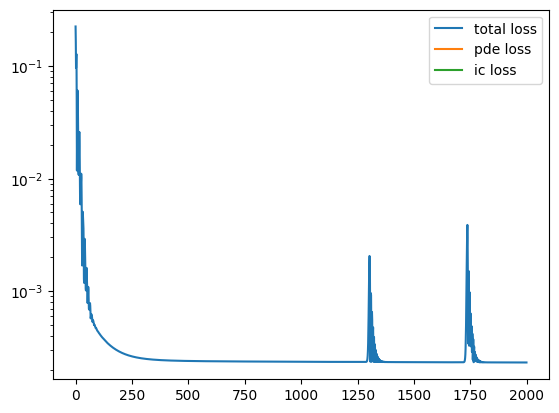

max time: 0.1, min_time 0.05
Epoch 0 - PDE Loss  20200.431641 - IC Loss  0.154026 - Total Loss  20200.585938
mean u: 0.0019843124
mean v: -0.0009375122
uv^2: 0.00012450009


2025-08-19 13:08:11.335904: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 100 - PDE Loss  9.515127 - IC Loss  0.076319 - Total Loss  9.591446
mean u: -0.04834508
mean v: -0.086080655
uv^2: -0.0060792393
Epoch 200 - PDE Loss  3.170635 - IC Loss  0.075968 - Total Loss  3.246603
mean u: -0.048328195
mean v: -0.08730591
uv^2: -0.005773469
Epoch 300 - PDE Loss  2.079631 - IC Loss  0.075227 - Total Loss  2.154858
mean u: -0.04832194
mean v: -0.08516298
uv^2: -0.0057079736
Epoch 400 - PDE Loss  1.808809 - IC Loss  0.073449 - Total Loss  1.882258
mean u: -0.04830962
mean v: -0.081975795
uv^2: -0.0056393263


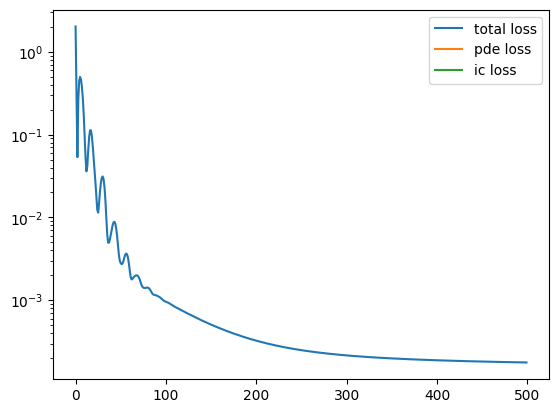

max time: 0.15, min_time 0.1
Epoch 0 - PDE Loss  6823.016113 - IC Loss  0.100179 - Total Loss  6823.116211
mean u: -0.0019490919
mean v: 0.0028880797
uv^2: 4.1030933e-05
Epoch 100 - PDE Loss  4.190314 - IC Loss  0.073513 - Total Loss  4.263826
mean u: -0.048096046
mean v: -0.06952645
uv^2: -0.0037973213
Epoch 200 - PDE Loss  2.425848 - IC Loss  0.070025 - Total Loss  2.495873
mean u: -0.04823552
mean v: -0.07367563
uv^2: -0.0036083055
Epoch 300 - PDE Loss  1.881434 - IC Loss  0.067901 - Total Loss  1.949336
mean u: -0.048245855
mean v: -0.07532772
uv^2: -0.0034068068
Epoch 400 - PDE Loss  1.669472 - IC Loss  0.065271 - Total Loss  1.734744
mean u: -0.048250753
mean v: -0.07699538
uv^2: -0.00324629


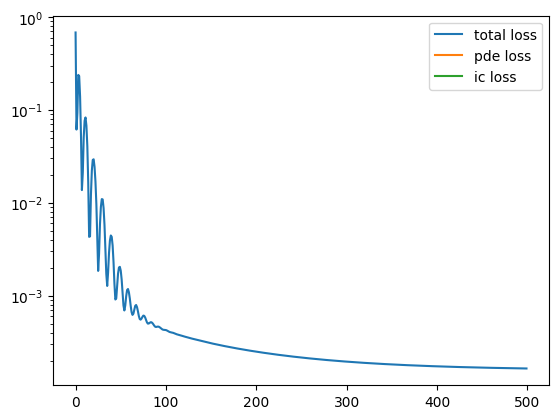

max time: 0.2, min_time 0.15
Epoch 0 - PDE Loss  7809.366699 - IC Loss  0.304488 - Total Loss  7809.671387
mean u: 0.0022858784
mean v: -0.011140935
uv^2: 0.0009425764
Epoch 100 - PDE Loss  3.357867 - IC Loss  0.184141 - Total Loss  3.542007
mean u: -0.048222516
mean v: -0.0049896706
uv^2: -0.0025740922
Epoch 200 - PDE Loss  2.082489 - IC Loss  0.170383 - Total Loss  2.252872
mean u: -0.04806645
mean v: -0.009311212
uv^2: -0.0022261974
Epoch 300 - PDE Loss  1.826348 - IC Loss  0.158170 - Total Loss  1.984518
mean u: -0.0480937
mean v: -0.0144647015
uv^2: -0.0020033
Epoch 400 - PDE Loss  1.696872 - IC Loss  0.147106 - Total Loss  1.843979
mean u: -0.048113648
mean v: -0.01981814
uv^2: -0.0018216228


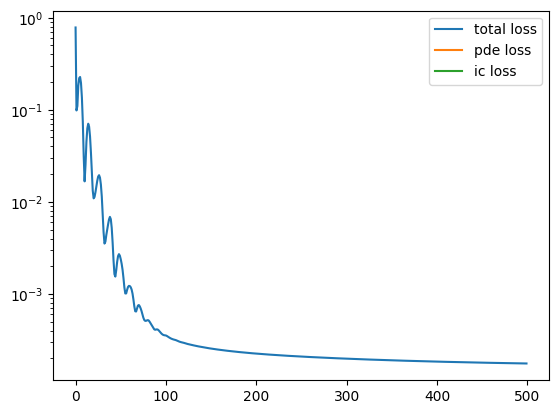

max time: 0.25, min_time 0.2
Epoch 0 - PDE Loss  46230.375000 - IC Loss  0.249585 - Total Loss  46230.625000
mean u: -0.0038262168
mean v: 0.0015753283
uv^2: -0.00022610967
Epoch 100 - PDE Loss  5.349658 - IC Loss  0.054264 - Total Loss  5.403922
mean u: -0.04812996
mean v: -0.11507961
uv^2: -0.007725694
Epoch 200 - PDE Loss  3.370703 - IC Loss  0.053244 - Total Loss  3.423946
mean u: -0.048387323
mean v: -0.11516284
uv^2: -0.0076574767
Epoch 300 - PDE Loss  2.386029 - IC Loss  0.052502 - Total Loss  2.438531
mean u: -0.048390355
mean v: -0.11442922
uv^2: -0.007573326
Epoch 400 - PDE Loss  1.924379 - IC Loss  0.051924 - Total Loss  1.976303
mean u: -0.048395995
mean v: -0.11312706
uv^2: -0.007511807


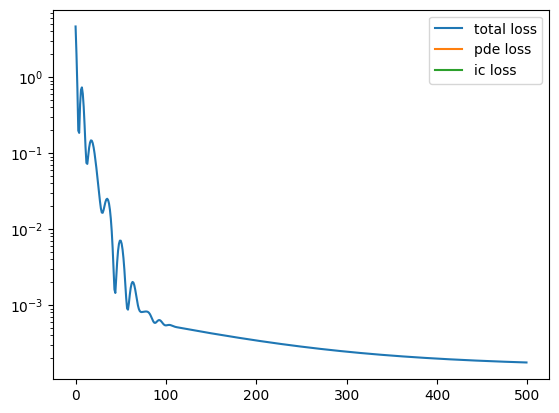

max time: 0.3, min_time 0.25
Epoch 0 - PDE Loss  9508.043945 - IC Loss  0.082915 - Total Loss  9508.126953
mean u: 3.6843016e-05
mean v: 0.000473205
uv^2: 9.474442e-06


2025-08-19 13:10:17.896618: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 100 - PDE Loss  5.417322 - IC Loss  0.039518 - Total Loss  5.456840
mean u: -0.047909975
mean v: -0.08562938
uv^2: -0.0017233734
Epoch 200 - PDE Loss  3.043142 - IC Loss  0.035734 - Total Loss  3.078876
mean u: -0.048009
mean v: -0.08462773
uv^2: -0.002007781
Epoch 300 - PDE Loss  2.238965 - IC Loss  0.033947 - Total Loss  2.272912
mean u: -0.048084594
mean v: -0.08197788
uv^2: -0.0021922262
Epoch 400 - PDE Loss  1.897066 - IC Loss  0.032985 - Total Loss  1.930050
mean u: -0.048131205
mean v: -0.07886358
uv^2: -0.002319333


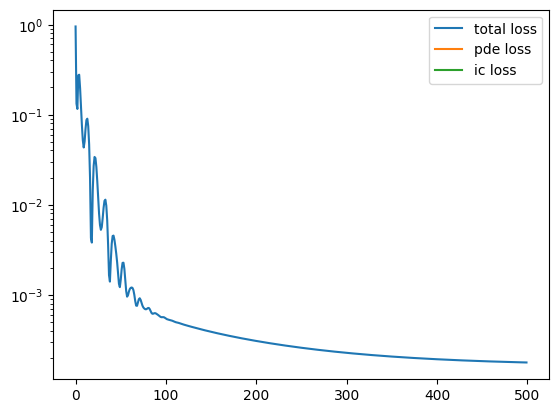

max time: 0.35, min_time 0.3
Epoch 0 - PDE Loss  13665.398438 - IC Loss  0.110114 - Total Loss  13665.508789
mean u: -0.0032538262
mean v: 5.9554197e-05
uv^2: -1.0809637e-05
Epoch 100 - PDE Loss  3.493176 - IC Loss  0.053515 - Total Loss  3.546691
mean u: -0.048501033
mean v: -0.11038357
uv^2: -0.0014437848
Epoch 200 - PDE Loss  2.189815 - IC Loss  0.051242 - Total Loss  2.241057
mean u: -0.048434023
mean v: -0.11329934
uv^2: -0.0014423315
Epoch 300 - PDE Loss  1.817564 - IC Loss  0.049133 - Total Loss  1.866697
mean u: -0.04844046
mean v: -0.116187915
uv^2: -0.0014667123
Epoch 400 - PDE Loss  1.652890 - IC Loss  0.046940 - Total Loss  1.699831
mean u: -0.04844617
mean v: -0.1189122
uv^2: -0.0014951222


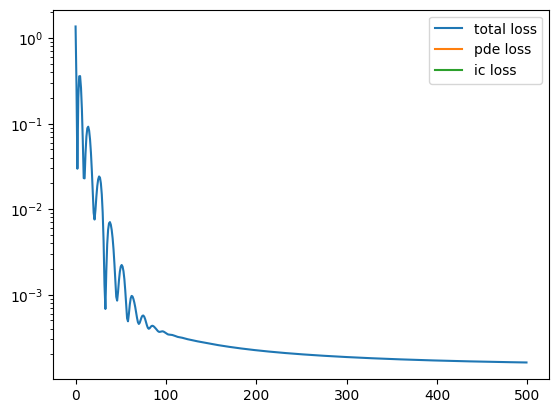

max time: 0.4, min_time 0.35
Epoch 0 - PDE Loss  18203.095703 - IC Loss  0.120550 - Total Loss  18203.216797
mean u: 0.0031858836
mean v: -0.0024300113
uv^2: 0.00012481159
Epoch 100 - PDE Loss  4.172776 - IC Loss  0.048930 - Total Loss  4.221706
mean u: -0.0483039
mean v: -0.040940166
uv^2: -0.0026865979
Epoch 200 - PDE Loss  2.778599 - IC Loss  0.047821 - Total Loss  2.826419
mean u: -0.048103698
mean v: -0.04193792
uv^2: -0.0025938419
Epoch 300 - PDE Loss  2.286670 - IC Loss  0.046672 - Total Loss  2.333342
mean u: -0.048134875
mean v: -0.042913113
uv^2: -0.0025335418
Epoch 400 - PDE Loss  2.004219 - IC Loss  0.045316 - Total Loss  2.049535
mean u: -0.048157256
mean v: -0.043956593
uv^2: -0.002477996


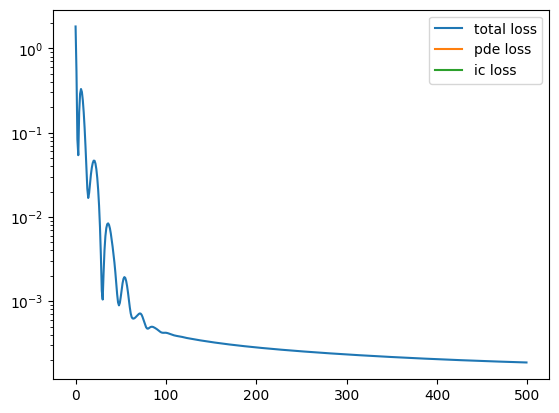

max time: 0.45, min_time 0.4
Epoch 0 - PDE Loss  38873.644531 - IC Loss  0.144388 - Total Loss  38873.789062
mean u: 0.0041442565
mean v: 0.0006634932
uv^2: 0.0002521401
Epoch 100 - PDE Loss  5.561911 - IC Loss  0.100621 - Total Loss  5.662532
mean u: -0.04921775
mean v: -0.1689966
uv^2: -0.011406081
Epoch 200 - PDE Loss  3.465141 - IC Loss  0.098320 - Total Loss  3.563461
mean u: -0.048541877
mean v: -0.1667209
uv^2: -0.011121032
Epoch 300 - PDE Loss  2.587337 - IC Loss  0.096300 - Total Loss  2.683638
mean u: -0.048541125
mean v: -0.16448848
uv^2: -0.010942592
Epoch 400 - PDE Loss  2.154674 - IC Loss  0.094412 - Total Loss  2.249086
mean u: -0.04853773
mean v: -0.1622508
uv^2: -0.010775218


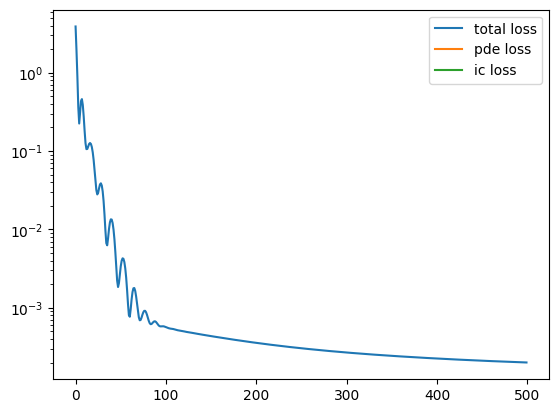

max time: 0.5, min_time 0.45
Epoch 0 - PDE Loss  47697.664062 - IC Loss  0.359732 - Total Loss  47698.023438
mean u: -0.00067631475
mean v: -0.002562118
uv^2: -3.4226443e-05
Epoch 100 - PDE Loss  6.100796 - IC Loss  0.283313 - Total Loss  6.384109
mean u: -0.04878904
mean v: -0.2616522
uv^2: -0.0051052053
Epoch 200 - PDE Loss  3.646810 - IC Loss  0.277152 - Total Loss  3.923963
mean u: -0.04883324
mean v: -0.25614554
uv^2: -0.0048876586
Epoch 300 - PDE Loss  2.797675 - IC Loss  0.272957 - Total Loss  3.070632
mean u: -0.048829034
mean v: -0.25457364
uv^2: -0.0047835684
Epoch 400 - PDE Loss  2.350253 - IC Loss  0.268100 - Total Loss  2.618352
mean u: -0.048811406
mean v: -0.2530876
uv^2: -0.004677615


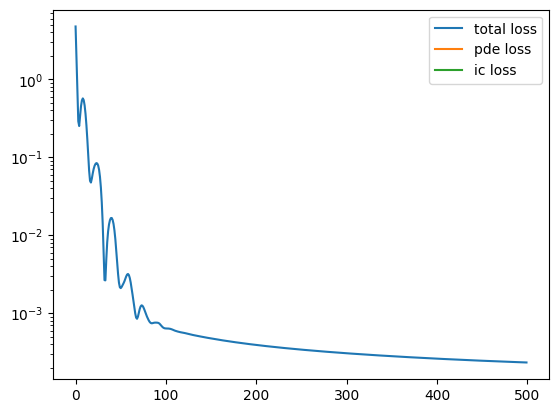

max time: 0.5, min_time 0.0
Epoch 0 - PDE Loss  1.481614 - IC Loss  1.019924 - Total Loss  2.560969
mean u: 0.0012507837
mean v: -0.0011190764
uv^2: 2.343982e-05
Epoch 100 - PDE Loss  1.487708 - IC Loss  0.734560 - Total Loss  2.285861
mean u: -0.05371281
mean v: -0.0688235
uv^2: -0.0025404517
Epoch 200 - PDE Loss  1.508713 - IC Loss  0.474541 - Total Loss  2.052223
mean u: -0.04945569
mean v: -0.06327139
uv^2: 0.00022103233
Epoch 300 - PDE Loss  1.482895 - IC Loss  0.326455 - Total Loss  1.869090
mean u: -0.059189357
mean v: -0.0717703
uv^2: -0.00041124286
Epoch 400 - PDE Loss  1.427906 - IC Loss  0.221584 - Total Loss  1.701991
mean u: -0.044264123
mean v: -0.064916104
uv^2: -0.00037485734
Epoch 500 - PDE Loss  1.333810 - IC Loss  0.167200 - Total Loss  1.552232
mean u: -0.040043455
mean v: -0.06136433
uv^2: -0.00033256915
Epoch 600 - PDE Loss  1.229532 - IC Loss  0.136945 - Total Loss  1.419045
mean u: -0.04219659
mean v: -0.06499003
uv^2: -0.0010098612
Epoch 700 - PDE Loss  1.12664

2025-08-19 13:14:15.316919: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 1700 - PDE Loss  0.561736 - IC Loss  0.054790 - Total Loss  0.705640
mean u: -0.052380003
mean v: -0.084655285
uv^2: -0.010003622
Epoch 1800 - PDE Loss  0.537656 - IC Loss  0.054017 - Total Loss  0.682127
mean u: -0.053839784
mean v: -0.08751545
uv^2: -0.010910928
Epoch 1900 - PDE Loss  0.513554 - IC Loss  0.052526 - Total Loss  0.658218
mean u: -0.054727722
mean v: -0.08670599
uv^2: -0.01160437
Epoch 2000 - PDE Loss  0.491066 - IC Loss  0.051202 - Total Loss  0.636507
mean u: -0.05606513
mean v: -0.08440823
uv^2: -0.012377223
Epoch 2100 - PDE Loss  0.468537 - IC Loss  0.049898 - Total Loss  0.614620
mean u: -0.055484764
mean v: -0.08732377
uv^2: -0.01266115
Epoch 2200 - PDE Loss  0.452467 - IC Loss  0.048736 - Total Loss  0.599202
mean u: -0.05511842
mean v: -0.08581493
uv^2: -0.0129211685
Epoch 2300 - PDE Loss  0.434598 - IC Loss  0.048074 - Total Loss  0.581703
mean u: -0.056330785
mean v: -0.087896526
uv^2: -0.013355429
Epoch 2400 - PDE Loss  0.421916 - IC Loss  0.047342 - To

2025-08-19 13:20:41.746991: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 9900 - PDE Loss  0.156858 - IC Loss  0.026621 - Total Loss  0.288444
mean u: -0.05624303
mean v: -0.09456581
uv^2: -0.010774083


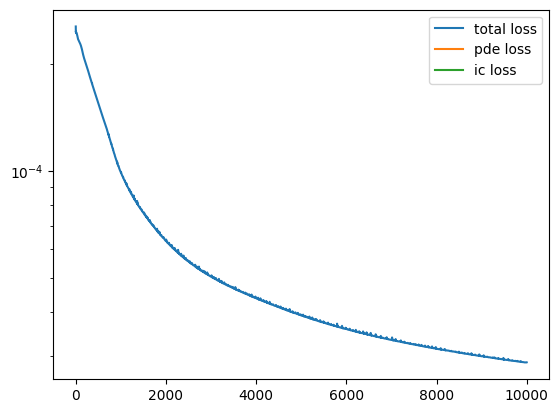

In [59]:
steps = 10
models = []
inits = []
intervals = []
for i in range(1, steps+2):
    epochs = 500
    max_time = i * tmax / steps
    if i == steps + 1:
        max_time = tmax
        min_time = 0.0
        # epochs = 4 * epochs
    elif i == 1:
        min_time = 0.0
        epochs = 2000
    else:
        min_time = ((i-1) * tmax / steps)
    print(f"max time: {max_time}, min_time {min_time}")
    intervals.append((min_time, max_time))
    pde_pts, ic_pts = generatePoints(N_inputs, sphere, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, tmin=min_time, tmax=max_time)
    if i > 1 and i != steps+1:
        xi, yi, zi = ic_pts[0][:,0:1], ic_pts[0][:,1:2], ic_pts[0][:,2:3]
        ti = tf.ones_like(x) * min_time
        ui = models[i-2]([xi, yi, zi, ti])
        ic_pts = [tf.concat([xi, yi, zi, ti], axis=1), ui]
    x, y, z, t = pde_pts[:,0:1], pde_pts[:,1:2], pde_pts[:,2:3], pde_pts[:,3:4]
    normals =  tf.convert_to_tensor(normalVector(pde_pts[:,0:3]), dtype=tf.float32)
    normal_jacobian = tf.convert_to_tensor(compute_normal_jacobian(pde_pts[:,0:3].numpy(), normals.numpy()), dtype=tf.float32)
    # init = tf.concat(initial(x, y, z), axis=-1)
    if i != steps+1:
        init = build_init(i, models, x, y, z, intervals)
        # if i == 1:
        #     init = initial(x, y, z)
        #     init = tf.concat(init, axis=-1)
        #     inits.append(init)
        
        # elif i != 1:
        #     init = hardConstraint(model, x, y, z, tf.ones_like(x) * min_time, i, models, inits, intervals, min_time, max_time)
        #     inits.append(init)

        @tf.function(reduce_retracing=True)
        def ts(model, optimizer, pde_pts, ic_pts, step, init, models, intervals, min_time, max_time, normals, normal_jacobian, lambda_pde=1.0, lambda_ic=1.0, alpha=0.0): 
            return trainingStep(model, optimizer, pde_pts, ic_pts, step, init, models, intervals, min_time, max_time, normals, normal_jacobian, lambda_pde=1.0, lambda_ic=1.0, alpha=0.0)
        all_pts = tf.concat([pde_pts, ic_pts[0]], axis=0) # use this one for soft constraints
        pmin = tf.reduce_min(all_pts, axis=0)
        pmax = tf.reduce_max(all_pts, axis=0)
        model = buildModel(width, depth, pmin, pmax)
        optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

        losses, pde_losses, ic_losses, l2s, grads, uv2 = train(ts, model, optimizer, pde_pts, ic_pts, i, init, models, intervals, min_time, max_time, normals, normal_jacobian, epochs=epochs)

    else:
        init = initial(x, y, z)
        init = tf.concat(init, axis=-1)   
        inits.append(init)
        inits_j = []  
        intervals_j = []


        all_pts = tf.concat([pde_pts, ic_pts[0]], axis=0) # use this one for soft constraints
        pmin = tf.reduce_min(all_pts, axis=0)
        pmax = tf.reduce_max(all_pts, axis=0)
        model = buildModel(width, depth, pmin, pmax)
        optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

        def helper_hc(model, x, y, z, t, init, tmin=tmin, tmax=tmax):
            x, y, z, t = tf.reshape(x, [-1, 1]), tf.reshape(y, [-1, 1]), tf.reshape(z, [-1, 1]), tf.reshape(t, [-1, 1])
            nn = model([x, y, z, t])

            # uv0 = tf.concat(initial(x,y,z), axis=-1)
            uv0 = init

            u = uv0 + (t - tmin) / (tmax - tmin)
            # u = initial(x, y, z, radii) + nn

            return u
        
        normals = normalVector(pde_pts[:,0:3])
        normal_jacobian = tf.convert_to_tensor(compute_normal_jacobian(pde_pts[:,0:3].numpy(), normals), dtype=tf.float32)

        data = prediction(x, y, z, t, models, intervals)

        losses, pde_losses, ic_losses, l2s, grads, uv2 = train(final_training_step, model, optimizer, pde_pts, ic_pts, 0, init, models, intervals, min_time, max_time, normals, normal_jacobian, final=True, data=data, epochs=10000)

    models.append(model)

# if i % 25 == 0:
#     model.save_weights('fitz_hugh_sphere.weights.h5')
#     print('Saved weights!')
# if i == steps:
#     model.save_weights('fitz_hugh_sphere.weights.h5')
#     print('Saved weights and finished training!')        
    losses = [l.numpy() for l in losses]
    pde_losses = [l.numpy() for l in pde_losses]
    ic_losses = [l.numpy() for l in ic_losses]
    plt.plot(losses, label='total loss')
    plt.plot(pde_losses, label='pde loss')
    plt.plot(ic_losses, label='ic loss')
    plt.legend()
    plt.yscale('log')
    plt.show()

In [60]:
# losses, pde_losses, ic_losses, l2s, grads, uv2 = train(model, optimizer, pde_pts, ic_pts, u_sc, v_sc, radii, normals, normal_jacobian, epochs=5000)
# losses = [l.numpy() for l in losses]
# pde_losses = [l.numpy() for l in pde_losses]
# ic_losses = [l.numpy() for l in ic_losses]
# uv2s = [l for l in uv2]

In [61]:
# model.save_weights('sphere_gs.weights.h5')

In [62]:
# plt.plot(losses, label='total loss')
# plt.plot(pde_losses, label='pde loss')
# plt.plot(ic_losses, label='ic loss')
# plt.legend()
# # plt.xscale('log')
# plt.yscale('log')

In [63]:
# plt.plot(uv2s)
# plt.yscale('log')

In [64]:
print(tf.random.normal((1,)))

tf.Tensor([-0.3557881], shape=(1,), dtype=float32)


In [65]:
def set_axes_equal_tensorflow(ax, x, y, z):
    x = tf.reshape(x, [-1]).numpy()
    y = tf.reshape(y, [-1]).numpy()
    z = tf.reshape(z, [-1]).numpy()

    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()
    z_min, z_max = z.min(), z.max()

    x_range = x_max - x_min
    y_range = y_max - y_min
    z_range = z_max - z_min

    max_range = max(x_range, y_range, z_range)

    x_middle = 0.5 * (x_max + x_min)
    y_middle = 0.5 * (y_max + y_min)
    z_middle = 0.5 * (z_max + z_min)

    ax.set_xlim([x_middle - max_range/2, x_middle + max_range/2])
    ax.set_ylim([y_middle - max_range/2, y_middle + max_range/2])

In [66]:
def modelResults(model, surface, umin=0.0, umax=umax, vmin=0.0, vmax=1.0, t_steps=3, tmax=tmax, resolution=100, load=False, saveplots=False):
  if load:
    model.load_weights(load)

  test_pde_pts, _ = generatePoints(resolution, sphere, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, tmin=tmin, tmax=tmax)

  x, y, z = test_pde_pts[:,0:1], test_pde_pts[:,1:2], test_pde_pts[:,2:3]

  # norm_actual, norm_pred, colors_actual, colors_pred = None, None, None, None
  init = tf.concat(initial(x, y, z), axis=-1)

  u_norm_pred = None
  v_norm_pred = None
  
  azim = 160

  for i in range(t_steps+1):
    t = tf.ones_like(x) * (i * tmax / t_steps)
    pde_pts = tf.stack([x, y, z, t], axis=1)

    x, y, z, t = tf.squeeze(x), tf.squeeze(y), tf.squeeze(z), tf.squeeze(t)

    print(f"t={i * tmax / t_steps}")

    print(init.shape, final_hard_constraint(models[-1], x, y, z, t, tmin=tmin, tmax=tmax).shape)

    if i == 0:
      print(f"Initial condition error: {L2Error(init, final_hard_constraint(models[-1], x, y, z, t, tmin=tmin, tmax=tmax))}")
    u_pred = tf.reshape(final_hard_constraint(models[-1], x, y, z, t, tmin=tmin, tmax=tmax)[:,0], x.shape).numpy()
    # u_pred = tf.reshape(prediction(x, y, z, t, models, intervals)[:,0], x.shape).numpy()
    if i == i: 
      u_norm_pred = plt.Normalize(vmin=u_pred.min(), vmax=u_pred.max())

    X = x.numpy().ravel()
    Y = y.numpy().ravel()
    Z = z.numpy().ravel()
  
    UP = u_pred.ravel()             

    fig = plt.figure(figsize=(8, 4))

    ax2    = fig.add_subplot(121, projection='3d')

    ax2.set_box_aspect([1, 1, 1])

    u_sc_pred = ax2.scatter(
        X, Y, Z,
        c=UP,
        cmap='jet',
        norm=u_norm_pred,
        marker='o'
    )

    fig.colorbar(u_sc_pred, ax=ax2,  shrink=0.6)

    # set_axes_equal_tensorflow(ax2,    x, y, z)

    ax2.view_init(elev=15, azim=azim)

    v_pred = tf.reshape(final_hard_constraint(models[-1], x, y, z, t, tmin=tmin, tmax=tmax)[:,1], x.shape).numpy()
    # v_pred = tf.reshape(prediction(x, y, z, t, models, intervals)[:,1], x.shape).numpy()

    if i == i:
      v_norm_pred = plt.Normalize(vmin=v_pred.min(), vmax=v_pred.max())

    X = x.numpy().ravel()
    Y = y.numpy().ravel()
    Z = z.numpy().ravel()

    VP = v_pred.ravel()             

    ax3 = fig.add_subplot(122, projection='3d')

    ax3.set_box_aspect([1, 1, 1])

    v_sc_pred = ax3.scatter(
        X, Y, Z,
        c=VP,
        cmap='jet',
        norm=v_norm_pred,
        marker='o'
    )

    fig.colorbar(v_sc_pred, ax=ax3, shrink=0.6)

    # set_axes_equal_tensorflow(ax3, x, y, z)

    ax3.view_init(elev=15, azim=azim)
    
    ax2.set_aspect('equal')
    ax3.set_aspect('equal')

    plt.show()


  if saveplots:
    plt.savefig(f'{surface.__name__}_results.png')
  plt.show()

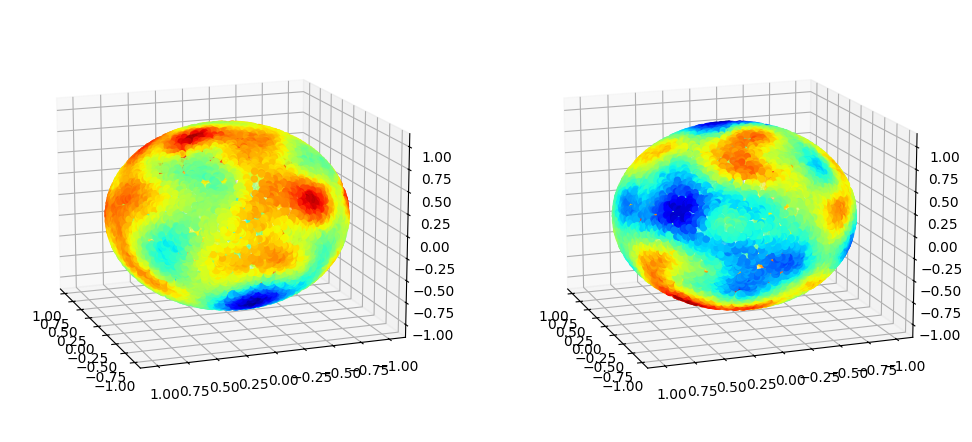

In [67]:
test_pde_pts, _ = generatePoints(10000, sphere, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, tmin=tmin, tmax=tmax)

x, y, z = test_pde_pts[:,0:1], test_pde_pts[:,1:2], test_pde_pts[:,2:3]

fig = plt.figure(figsize=(12, 6))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122, projection='3d')
initial_cond = initial(x, y, z)
u0 = initial_cond[0]
v0 = initial_cond[1]
u0_norm = plt.Normalize(vmin=u0.numpy().min(), vmax=u0.numpy().max())
v0_norm = plt.Normalize(vmin=v0.numpy().min(), vmax=v0.numpy().max())

scatter_u = ax1.scatter(x, y, z, c=u0, cmap='jet', norm=u0_norm, marker='o')
scatter_v = ax2.scatter(x, y, z, c=v0, cmap='jet', norm=v0_norm, marker='o')

for ax in [ax1, ax2]:
    ax.view_init(elev=15, azim=160)
plt.show()

t=0.0
(10000, 2) (10000, 2)
Initial condition error: 1.3781801462173462


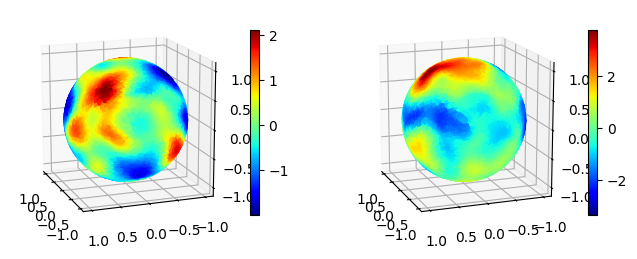

t=0.03333333333333333
(10000, 2) (10000, 2)


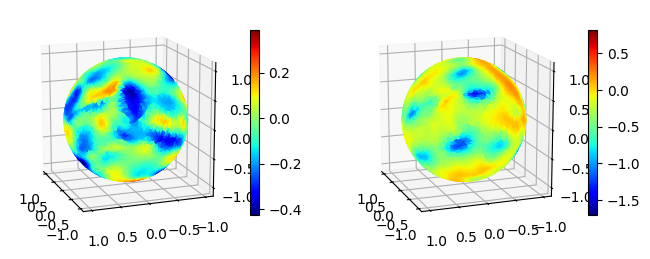

t=0.06666666666666667
(10000, 2) (10000, 2)


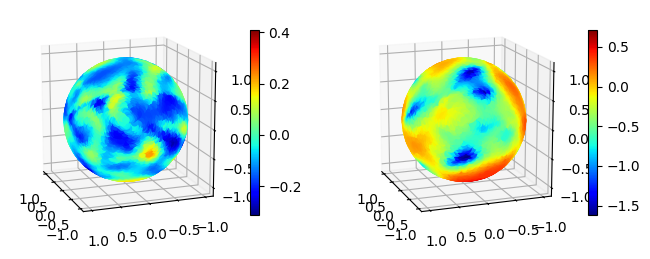

t=0.1
(10000, 2) (10000, 2)


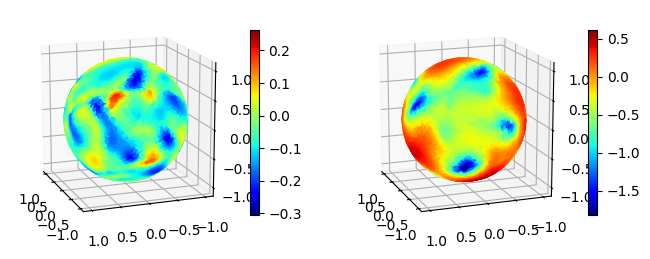

t=0.13333333333333333
(10000, 2) (10000, 2)


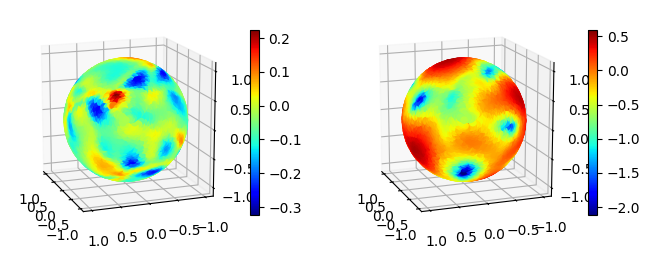

t=0.16666666666666666
(10000, 2) (10000, 2)


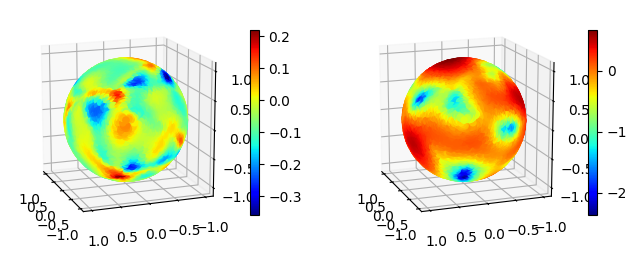

t=0.2
(10000, 2) (10000, 2)


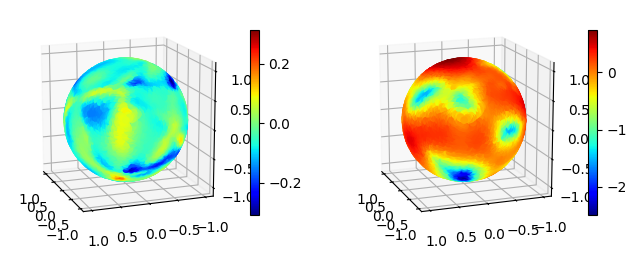

t=0.23333333333333334
(10000, 2) (10000, 2)


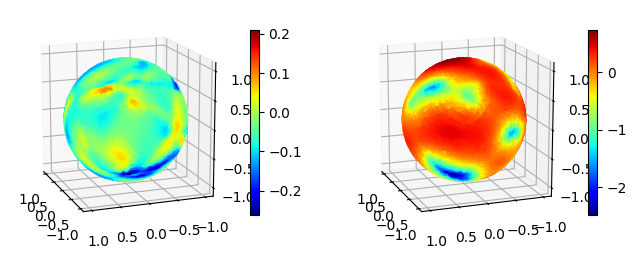

t=0.26666666666666666
(10000, 2) (10000, 2)


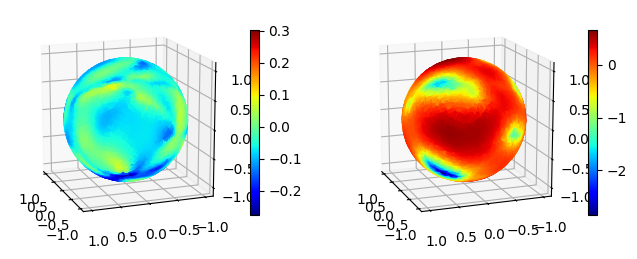

t=0.3
(10000, 2) (10000, 2)


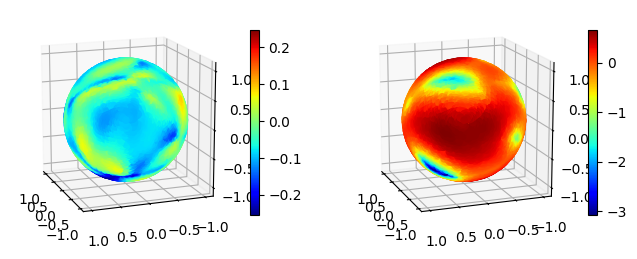

t=0.3333333333333333
(10000, 2) (10000, 2)


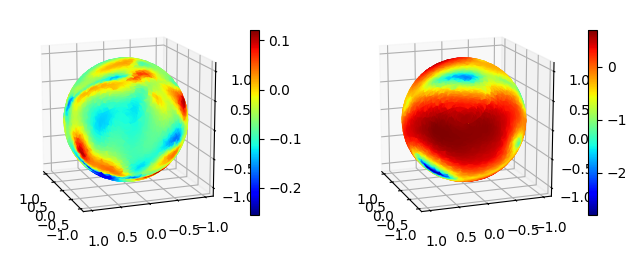

t=0.36666666666666664
(10000, 2) (10000, 2)


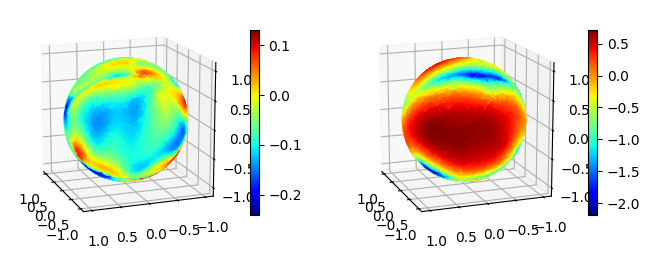

t=0.4
(10000, 2) (10000, 2)


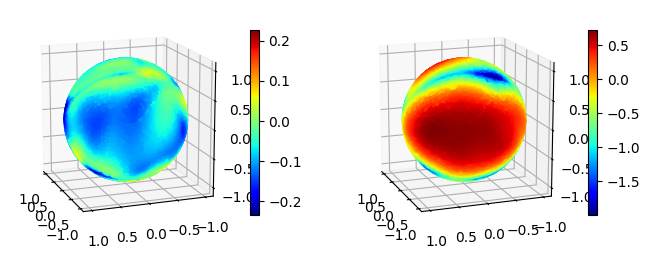

t=0.43333333333333335
(10000, 2) (10000, 2)


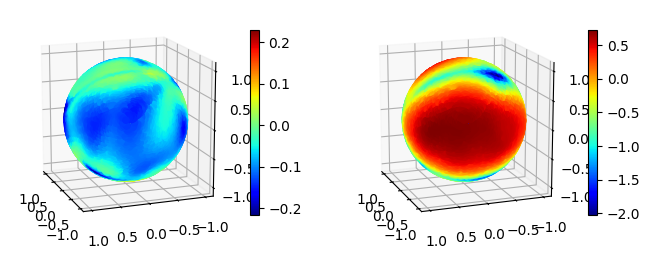

t=0.4666666666666667
(10000, 2) (10000, 2)


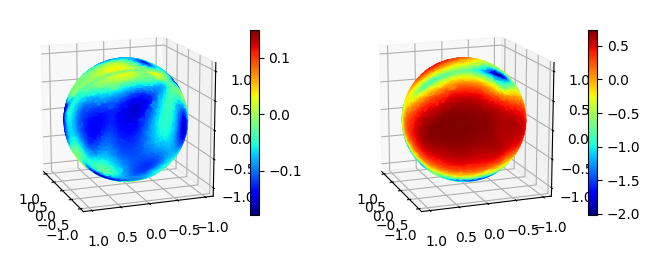

t=0.5
(10000, 2) (10000, 2)


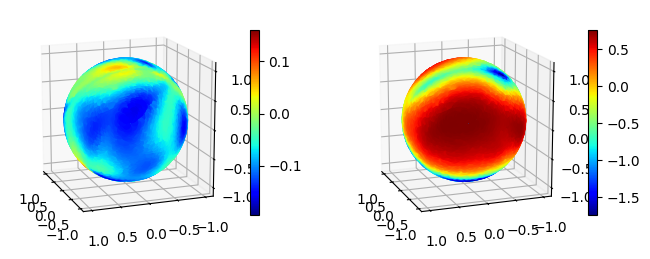

In [68]:
modelResults(model, sphere, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, t_steps=15, tmax=tmax, resolution=10000, load=False, saveplots=False)

In [69]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def modelResults(model, surface, umin=0.0, umax=umax, vmin=0.0, vmax=1.0, t_steps=3, tmax=tmax, resolution=100, load=False, saveplots=False):
    if load:
        model.load_weights(load)
    test_pde_pts, _ = generatePoints(resolution, sphere, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, tmin=tmin, tmax=tmax)
    x, y, z = test_pde_pts[:,0:1], test_pde_pts[:,1:2], test_pde_pts[:,2:3]
    # norm_actual, norm_pred, colors_actual, colors_pred = None, None, None, None
    init = tf.concat(initial(x, y, z), axis=-1)
    u_norm_pred = None
    v_norm_pred = None
    
    for i in range(t_steps+1):
        t = tf.ones_like(x) * (i * tmax / t_steps)
        pde_pts = tf.stack([x, y, z, t], axis=1)
        x, y, z, t = tf.squeeze(x), tf.squeeze(y), tf.squeeze(z), tf.squeeze(t)
        print(f"t={i * tmax / t_steps}")
        
        u_pred = tf.reshape(final_hard_constraint(models[-1], x, y, z, t, tmin=tmin, tmax=tmax)[:,0], x.shape).numpy()
        # u_pred = tf.reshape(prediction(x, y, z, t, models, intervals)[:,0], x.shape).numpy()
        
        if i == i:
            u_norm_pred = (u_pred.min(), u_pred.max())
            
        X = x.numpy().ravel()
        Y = y.numpy().ravel()
        Z = z.numpy().ravel()
        UP = u_pred.ravel()
        
        # Create subplot figure
        fig = make_subplots(
            rows=1, cols=2,
            subplot_titles=('U Prediction', 'V Prediction'),
            specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]]
        )
        
        # U prediction scatter plot
        fig.add_trace(
            go.Scatter3d(
                x=X, y=Y, z=Z,
                mode='markers',
                marker=dict(
                    size=3,
                    color=UP,
                    colorscale='rainbow',
                    cmin=u_norm_pred[0],
                    cmax=u_norm_pred[1],
                    colorbar=dict(
                        x=0.45,
                        len=0.6,
                        title="U Value"
                    )
                ),
                name='U'
            ),
            row=1, col=1
        )
        
        v_pred = tf.reshape(final_hard_constraint(models[-1], x, y, z, t, tmin=tmin, tmax=tmax)[:,1], x.shape).numpy()
        # v_pred = tf.reshape(prediction(x, y, z, t, models, intervals)[:,1], x.shape).numpy()
        
        if i == i:
            v_norm_pred = (v_pred.min(), v_pred.max())
            
        VP = v_pred.ravel()
        
        # V prediction scatter plot
        fig.add_trace(
            go.Scatter3d(
                x=X, y=Y, z=Z,
                mode='markers',
                marker=dict(
                    size=3,
                    color=VP,
                    colorscale='rainbow',
                    cmin=v_norm_pred[0],
                    cmax=v_norm_pred[1],
                    colorbar=dict(
                        x=1.0,
                        len=0.6,
                        title="V Value"
                    )
                ),
                name='V'
            ),
            row=1, col=2
        )
        
        # Update layout for better visualization
        fig.update_layout(
            scene=dict(
                camera=dict(
                    eye=dict(x=1.5, y=1.5, z=0.5)
                ),
                aspectmode='cube'
            ),
            scene2=dict(
                camera=dict(
                    eye=dict(x=1.5, y=1.5, z=0.5)
                ),
                aspectmode='cube'
            ),
            width=1200,
            height=500,
            title=f"Model Results at t={i * tmax / t_steps}"
        )
        
        fig.show()
        
        if saveplots:
            fig.write_html(f'{surface.__name__}_results_t{i}.html')
            fig.write_image(f'{surface.__name__}_results_t{i}.png')

In [70]:
modelResults(model, sphere, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, t_steps=15, tmax=tmax, resolution=10000, load=False, saveplots=False)

t=0.0


t=0.03333333333333333


t=0.06666666666666667


t=0.1


t=0.13333333333333333


t=0.16666666666666666


t=0.2


t=0.23333333333333334


t=0.26666666666666666


t=0.3


t=0.3333333333333333


t=0.36666666666666664


t=0.4


t=0.43333333333333335


t=0.4666666666666667


t=0.5


In [71]:
# model.save_weights('fitz_hugh_10.weights.h5')

In [72]:
# import matplotlib.pyplot as plt
# import matplotlib.animation as animation
# import numpy as np
# import tensorflow as tf

# def modelResultsAnimated(model, surface, umin=0.0, umax=umax1.0, vmin=0.0, vmax=1.0, 
#                         t_steps=30, tmax=tmax, resolution=100, load=False, 
#                         save_animation=False, animation_filename='model_animation.mp4'):
#     """
#     Create an animated visualization of model results over time steps.
    
#     Parameters:
#     -----------
#     save_animation : bool
#         Whether to save the animation as a video file
#     animation_filename : str
#         Filename for saved animation (supports .mp4, .gif, etc.)
#     """
    
#     if load:
#         model.load_weights(load)
    
#     # Generate test points
#     test_pde_pts, _ = generatePoints(resolution, sphere, umin=0.0, umax=umax, 
#                                    vmin=0.0, vmax=2*np.pi, tmin=tmin, tmax=tmax)
#     x, y, z = test_pde_pts[:,0:1], test_pde_pts[:,1:2], test_pde_pts[:,2:3]
    
#     # Pre-compute all predictions for smooth animation
#     print("Pre-computing predictions for all time steps...")
#     all_u_pred = []
#     all_v_pred = []
#     time_values = []
    
#     for i in range(t_steps + 1):
#         t_val = i * tmax / t_steps
#         t = tf.ones_like(x) * t_val
#         x_sq, y_sq, z_sq, t_sq = tf.squeeze(x), tf.squeeze(y), tf.squeeze(z), tf.squeeze(t)
        
#         u_pred = tf.reshape(final_hard_constraint(models[-1], x_sq, y_sq, z_sq, t_sq, 
#                                                 tmin=tmin, tmax=tmax)[:,0], x_sq.shape).numpy()
#         v_pred = tf.reshape(final_hard_constraint(models[-1], x_sq, y_sq, z_sq, t_sq, 
#                                                 tmin=tmin, tmax=tmax)[:,1], x_sq.shape).numpy()
        
#         all_u_pred.append(u_pred.ravel())
#         all_v_pred.append(v_pred.ravel())
#         time_values.append(t_val)
#         print(f"Computed t={t_val:.3f}")
    
#     # Convert to numpy arrays for easier indexing
#     all_u_pred = np.array(all_u_pred)
#     all_v_pred = np.array(all_v_pred)
    
#     # Set up normalization for consistent color scaling across time steps
#     u_norm = plt.Normalize(vmin=all_u_pred.min(), vmax=all_u_pred.max())
#     v_norm = plt.Normalize(vmin=all_v_pred.min(), vmax=all_v_pred.max())
    
#     # Prepare coordinate arrays
#     X = x.numpy().ravel()
#     Y = y.numpy().ravel()
#     Z = z.numpy().ravel()
    
#     # Set up the figure and 3D axes
#     fig = plt.figure(figsize=(18, 8))
#     ax1 = fig.add_subplot(121, projection='3d')
#     ax2 = fig.add_subplot(122, projection='3d')
    
#     # Set up both axes
#     for ax, title in zip([ax1, ax2], ['U Prediction', 'V Prediction']):
#         ax.set_box_aspect([1, 1, 1])
#         set_axes_equal_tensorflow(ax, x, y, z)
#         ax.view_init(elev=15, azim=220)
#         ax.set_title(title, fontsize=14, pad=20)
    
#     # Initialize scatter plots
#     u_scatter = ax1.scatter(X, Y, Z, c=all_u_pred[0], cmap='rainbow', 
#                            norm=u_norm, marker='o', s=20)
#     v_scatter = ax2.scatter(X, Y, Z, c=all_v_pred[0], cmap='rainbow', 
#                            norm=v_norm, marker='o', s=20)
    
#     # Add colorbars
#     u_cbar = fig.colorbar(u_scatter, ax=ax1, shrink=0.6)
#     v_cbar = fig.colorbar(v_scatter, ax=ax2, shrink=0.6)
    
#     # Add time display
#     time_text = fig.suptitle(f'Time: {time_values[0]:.3f}', fontsize=16)
    
#     def update_frame(frame):
#         """Update function for animation"""
#         # Update scatter plot colors
#         u_scatter.set_array(all_u_pred[frame])
#         v_scatter.set_array(all_v_pred[frame])
        
#         # Update time display
#         time_text.set_text(f'Time: {time_values[frame]:.3f}')
        
#         return u_scatter, v_scatter, time_text
    
#     # Create animation
#     print("Creating animation...")
#     anim = animation.FuncAnimation(fig, update_frame, frames=len(time_values), 
#                                  interval=200, blit=False, repeat=True)
    
#     # Save animation if requested
#     if save_animation:
#         print(f"Saving animation as {animation_filename}...")
#         if animation_filename.endswith('.gif'):
#             anim.save(animation_filename, writer='pillow', fps=5)
#         else:
#             anim.save(animation_filename, writer='ffmpeg', fps=5)
#         print("Animation saved!")
    
#     # Display the animation
#     plt.tight_layout()
#     plt.show()
    
#     return anim  # Return animation object to keep it alive


# # Alternative version with more advanced features
# def modelResultsAnimatedAdvanced(model, surface, umin=0.0, umax=umax1.0, vmin=0.0, vmax=1.0, 
#                                t_steps=30, tmax=tmax, resolution=100, load=False, 
#                                save_animation=False, animation_filename='model_animation.mp4',
#                                show_trajectory=False, fps=10):
#     """
#     Advanced animated visualization with additional features.
    
#     Parameters:
#     -----------
#     show_trajectory : bool
#         Whether to show particle trajectories over time
#     fps : int
#         Frames per second for the animation
#     """
    
#     if load:
#         model.load_weights(load)
    
#     test_pde_pts, _ = generatePoints(resolution, sphere, umin=0.0, umax=umax, 
#                                    vmin=0.0, vmax=2*np.pi, tmin=tmin, tmax=tmax)
#     x, y, z = test_pde_pts[:,0:1], test_pde_pts[:,1:2], test_pde_pts[:,2:3]
    
#     # Pre-compute predictions
#     print("Pre-computing predictions...")
#     all_u_pred = []
#     all_v_pred = []
#     time_values = []
    
#     for i in range(t_steps + 1):
#         t_val = i * tmax / t_steps
#         t = tf.ones_like(x) * t_val
#         x_sq, y_sq, z_sq, t_sq = tf.squeeze(x), tf.squeeze(y), tf.squeeze(z), tf.squeeze(t)
        
#         u_pred = tf.reshape(final_hard_constraint(models[-1], x_sq, y_sq, z_sq, t_sq, 
#                                                 tmin=tmin, tmax=tmax)[:,0], x_sq.shape).numpy()
#         v_pred = tf.reshape(final_hard_constraint(models[-1], x_sq, y_sq, z_sq, t_sq, 
#                                                 tmin=tmin, tmax=tmax)[:,1], x_sq.shape).numpy()
        
#         all_u_pred.append(u_pred.ravel())
#         all_v_pred.append(v_pred.ravel())
#         time_values.append(t_val)
    
#     all_u_pred = np.array(all_u_pred)
#     all_v_pred = np.array(all_v_pred)
    
#     # Set up figure with subplots
#     fig = plt.figure(figsize=(20, 10))
    
#     # Main 3D plots
#     ax1 = fig.add_subplot(221, projection='3d')
#     ax2 = fig.add_subplot(222, projection='3d')
    
#     # Time series plots
#     ax3 = fig.add_subplot(223)
#     ax4 = fig.add_subplot(224)
    
#     # Configure 3D axes
#     X = x.numpy().ravel()
#     Y = y.numpy().ravel()
#     Z = z.numpy().ravel()
    
#     u_norm = plt.Normalize(vmin=all_u_pred.min(), vmax=all_u_pred.max())
#     v_norm = plt.Normalize(vmin=all_v_pred.min(), vmax=all_v_pred.max())
    
#     for ax, title in zip([ax1, ax2], ['U Prediction', 'V Prediction']):
#         ax.set_box_aspect([1, 1, 1])
#         set_axes_equal_tensorflow(ax, x, y, z)
#         ax.view_init(elev=15, azim=220)
#         ax.set_title(title)
    
#     # Initialize plots
#     u_scatter = ax1.scatter(X, Y, Z, c=all_u_pred[0], cmap='rainbow', norm=u_norm, s=20)
#     v_scatter = ax2.scatter(X, Y, Z, c=all_v_pred[0], cmap='rainbow', norm=v_norm, s=20)
    
#     fig.colorbar(u_scatter, ax=ax1, shrink=0.6)
#     fig.colorbar(v_scatter, ax=ax2, shrink=0.6)
    
#     # Set up time series plots
#     ax3.set_title('U Statistics Over Time')
#     ax3.set_xlabel('Time')
#     ax3.set_ylabel('U Value')
#     ax4.set_title('V Statistics Over Time')
#     ax4.set_xlabel('Time')
#     ax4.set_ylabel('V Value')
    
#     # Initialize time series data
#     u_means = np.mean(all_u_pred, axis=1)
#     u_mins = np.min(all_u_pred, axis=1)
#     u_maxs = np.max(all_u_pred, axis=1)
#     v_means = np.mean(all_v_pred, axis=1)
#     v_mins = np.min(all_v_pred, axis=1)
#     v_maxs = np.max(all_v_pred, axis=1)
    
#     # Plot full time series (faded)
#     ax3.plot(time_values, u_means, 'b-', alpha=0.3, label='Mean')
#     ax3.fill_between(time_values, u_mins, u_maxs, alpha=0.1, color='blue')
#     ax4.plot(time_values, v_means, 'r-', alpha=0.3, label='Mean')
#     ax4.fill_between(time_values, v_mins, v_maxs, alpha=0.1, color='red')
    
#     # Current time indicators
#     u_line = ax3.axvline(time_values[0], color='blue', linewidth=2)
#     v_line = ax4.axvline(time_values[0], color='red', linewidth=2)
    
#     ax3.legend()
#     ax4.legend()
    
#     time_text = fig.suptitle(f'Time: {time_values[0]:.3f}', fontsize=16)
    
#     def update_frame(frame):
#         # Update scatter plots
#         u_scatter.set_array(all_u_pred[frame])
#         v_scatter.set_array(all_v_pred[frame])
        
#         # Update time indicators
#         u_line.set_xdata([time_values[frame], time_values[frame]])
#         v_line.set_xdata([time_values[frame], time_values[frame]])
        
#         # Update time display
#         time_text.set_text(f'Time: {time_values[frame]:.3f}')
        
#         return u_scatter, v_scatter, u_line, v_line, time_text
    
#     # Create animation
#     anim = animation.FuncAnimation(fig, update_frame, frames=len(time_values), 
#                                  interval=1000//fps, blit=False, repeat=True)
    
#     if save_animation:
#         print(f"Saving animation as {animation_filename}...")
#         if animation_filename.endswith('.gif'):
#             anim.save(animation_filename, writer='pillow', fps=fps)
#         else:
#             anim.save(animation_filename, writer='ffmpeg', fps=fps)
    
#     plt.tight_layout()
#     plt.show()
    
#     return anim


# # Usage examples:
# """
# # Basic animation
# anim = modelResultsAnimated(model, surface, t_steps=50, save_animation=True, 
#                            animation_filename='basic_animation.mp4')

# # Advanced animation with time series
# anim = modelResultsAnimatedAdvanced(model, surface, t_steps=50, fps=15,
#                                    save_animation=True, 
#                                    animation_filename='advanced_animation.mp4')
# """
# anim = modelResultsAnimated(model, sphere, t_steps=50, umin=0.0, umax=umax, vmin=0.0, vmax=2*np.pi, resolution=200000, save_animation=True, 
#                            animation_filename='basic_animation.gif')